# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 47kB/s  eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

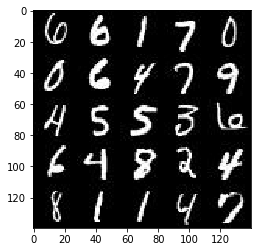

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

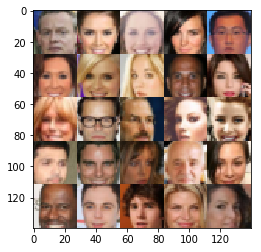

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name = 'input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name = 'input_z')
    learning_rate = tf.placeholder(tf.float32, (None))
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, training = True, alpha = 0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    x = images
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same',
                              kernel_initializer=tf.truncated_normal_initializer(stddev=0.02),
                              activation = tf.nn.relu)
        x1 = tf.layers.batch_normalization(x1, training=True)

        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding="same",
                              kernel_initializer = tf.truncated_normal_initializer(stddev=0.02),
                              activation=tf.nn.relu)
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)

        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding="same",
                              kernel_initializer = tf.truncated_normal_initializer(stddev=0.02),
                              activation=tf.nn.relu)
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.reshape(x3, (-1, 4*4*256))
        
        logits = tf.layers.dense(x3, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, reuse = False , alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        # Start with fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        
        # Reshape to start convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # Image size = 4x4x512
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 4, strides=1, padding='valid', 
                                        kernel_initializer = tf.truncated_normal_initializer(stddev=0.01))
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # Image size = 8x8x128
    
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same', 
                                        kernel_initializer = tf.truncated_normal_initializer(stddev=0.01))
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # Image size = 16x16x64
        
        x4 = tf.layers.conv2d_transpose(x3, 32, 5, strides=2, padding='same', 
                                        kernel_initializer = tf.truncated_normal_initializer(stddev=0.01))
        x4 = tf.layers.batch_normalization(x4, training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        # Image size = 32x32x32
        
        # Create the final layer with depth=output_channel_dim
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 3, strides=1, padding='same')
        # Image size = 28x28x3 
        
        # Use tanh for output
        output = tf.tanh(logits)

    return output
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha = 0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)
                                                * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_fake + d_loss_real
    
    return d_loss, g_loss
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    
    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
import time
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    inputs_real, inputs_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[-1])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    step = 0 
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                start_time = time.time()
                step = step+1
                batch_images = batch_images * 2
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                #print('batch_z shape=',batch_z.shape)
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={inputs_z: batch_z, lr:learning_rate})
                
                if step % 100 == 0:
                    train_loss_d = d_loss.eval({inputs_z:batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z:batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, step),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g),
                      "... Time spent={:.4f}".format(time.time() - start_time))    

                if step % 200 == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/20 Step 100... Discriminator Loss: 0.3453... Generator Loss: 5.3294 ... Time spent=0.1966
Epoch 1/20 Step 200... Discriminator Loss: 0.3449... Generator Loss: 5.4597 ... Time spent=0.1381


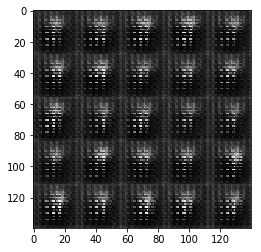

Epoch 1/20 Step 300... Discriminator Loss: 0.4494... Generator Loss: 3.4916 ... Time spent=0.1460
Epoch 1/20 Step 400... Discriminator Loss: 0.9452... Generator Loss: 1.1150 ... Time spent=0.1337


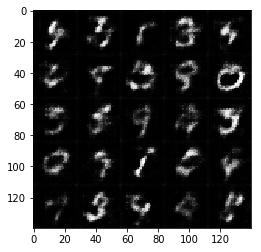

Epoch 1/20 Step 500... Discriminator Loss: 0.9354... Generator Loss: 1.1035 ... Time spent=0.1330
Epoch 1/20 Step 600... Discriminator Loss: 0.7907... Generator Loss: 1.3833 ... Time spent=0.1431


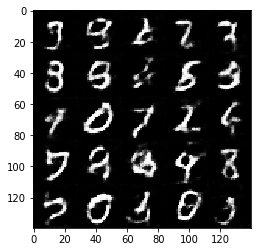

Epoch 1/20 Step 700... Discriminator Loss: 1.1142... Generator Loss: 0.8877 ... Time spent=0.1432
Epoch 1/20 Step 800... Discriminator Loss: 0.9369... Generator Loss: 1.0190 ... Time spent=0.1416


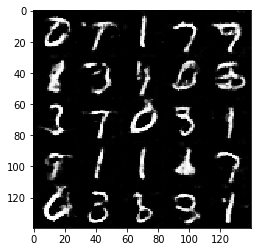

Epoch 1/20 Step 900... Discriminator Loss: 0.9557... Generator Loss: 1.0015 ... Time spent=0.1444
Epoch 2/20 Step 1000... Discriminator Loss: 1.0437... Generator Loss: 0.9471 ... Time spent=0.1307


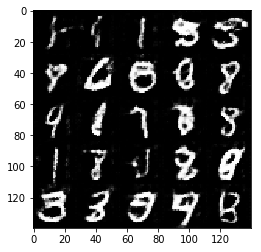

Epoch 2/20 Step 1100... Discriminator Loss: 0.8619... Generator Loss: 1.1597 ... Time spent=0.1285
Epoch 2/20 Step 1200... Discriminator Loss: 0.8904... Generator Loss: 1.2147 ... Time spent=0.1304


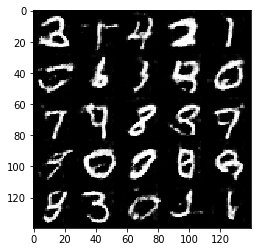

Epoch 2/20 Step 1300... Discriminator Loss: 1.0494... Generator Loss: 0.9869 ... Time spent=0.1308
Epoch 2/20 Step 1400... Discriminator Loss: 1.2528... Generator Loss: 0.6992 ... Time spent=0.1313


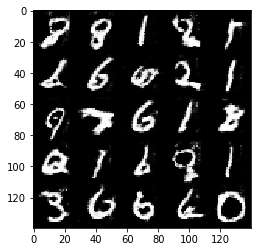

Epoch 2/20 Step 1500... Discriminator Loss: 0.7335... Generator Loss: 1.4719 ... Time spent=0.1316
Epoch 2/20 Step 1600... Discriminator Loss: 1.7972... Generator Loss: 0.3845 ... Time spent=0.1293


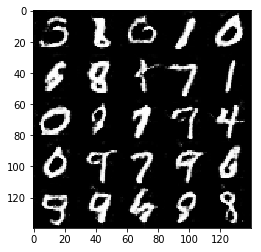

Epoch 2/20 Step 1700... Discriminator Loss: 0.6443... Generator Loss: 2.1470 ... Time spent=0.1313


KeyboardInterrupt: 

In [12]:
batch_size = 64
z_dim = 200
learning_rate = 0.0002
beta1 = 0.5


tf.reset_default_graph()
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 20

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/25 Step 100... Discriminator Loss: 0.4529... Generator Loss: 5.2474 ... Time spent=0.1762
Epoch 1/25 Step 200... Discriminator Loss: 0.4571... Generator Loss: 3.6716 ... Time spent=0.1278


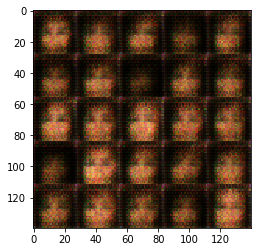

Epoch 1/25 Step 300... Discriminator Loss: 0.4326... Generator Loss: 3.7872 ... Time spent=0.1284
Epoch 1/25 Step 400... Discriminator Loss: 1.7915... Generator Loss: 0.6480 ... Time spent=0.1301


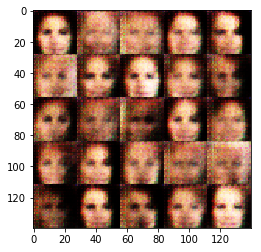

Epoch 1/25 Step 500... Discriminator Loss: 0.4844... Generator Loss: 2.9075 ... Time spent=0.1295
Epoch 1/25 Step 600... Discriminator Loss: 1.1523... Generator Loss: 0.9708 ... Time spent=0.1288


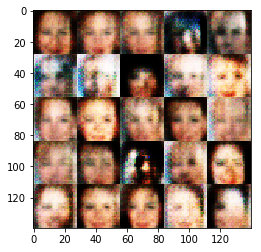

Epoch 1/25 Step 700... Discriminator Loss: 0.6893... Generator Loss: 2.4261 ... Time spent=0.1288
Epoch 1/25 Step 800... Discriminator Loss: 0.8138... Generator Loss: 2.2289 ... Time spent=0.1311


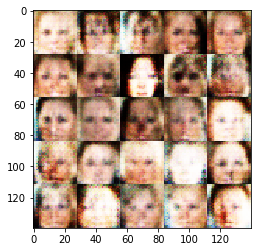

Epoch 1/25 Step 900... Discriminator Loss: 2.3557... Generator Loss: 0.2375 ... Time spent=0.1288
Epoch 1/25 Step 1000... Discriminator Loss: 1.4446... Generator Loss: 0.5944 ... Time spent=0.1292


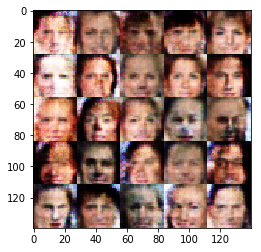

Epoch 1/25 Step 1100... Discriminator Loss: 0.6443... Generator Loss: 1.8681 ... Time spent=0.1299
Epoch 1/25 Step 1200... Discriminator Loss: 2.4544... Generator Loss: 5.5684 ... Time spent=0.1311


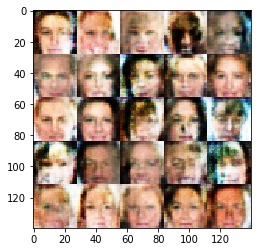

Epoch 1/25 Step 1300... Discriminator Loss: 0.6417... Generator Loss: 1.9300 ... Time spent=0.1291
Epoch 1/25 Step 1400... Discriminator Loss: 0.9795... Generator Loss: 0.9479 ... Time spent=0.1250


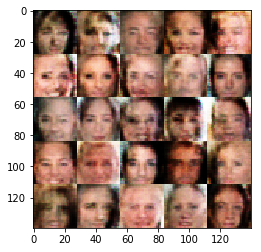

Epoch 1/25 Step 1500... Discriminator Loss: 0.8430... Generator Loss: 1.7866 ... Time spent=0.1296
Epoch 1/25 Step 1600... Discriminator Loss: 1.3289... Generator Loss: 0.6423 ... Time spent=0.1286


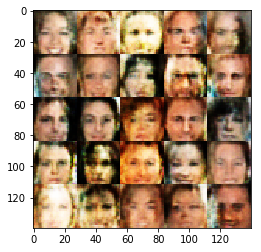

Epoch 1/25 Step 1700... Discriminator Loss: 1.1995... Generator Loss: 0.7331 ... Time spent=0.1278
Epoch 1/25 Step 1800... Discriminator Loss: 0.8429... Generator Loss: 1.1473 ... Time spent=0.1292


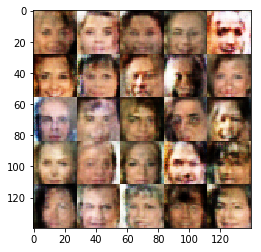

Epoch 1/25 Step 1900... Discriminator Loss: 1.4310... Generator Loss: 0.5390 ... Time spent=0.1284
Epoch 1/25 Step 2000... Discriminator Loss: 0.9268... Generator Loss: 1.0063 ... Time spent=0.1276


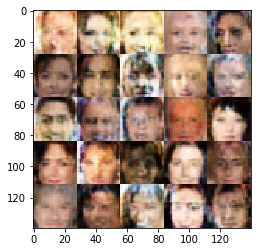

Epoch 1/25 Step 2100... Discriminator Loss: 0.7728... Generator Loss: 1.4494 ... Time spent=0.1324
Epoch 1/25 Step 2200... Discriminator Loss: 1.9314... Generator Loss: 0.3587 ... Time spent=0.1297


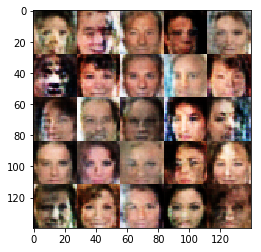

Epoch 1/25 Step 2300... Discriminator Loss: 1.5024... Generator Loss: 0.4614 ... Time spent=0.1292
Epoch 1/25 Step 2400... Discriminator Loss: 0.6447... Generator Loss: 1.8649 ... Time spent=0.1291


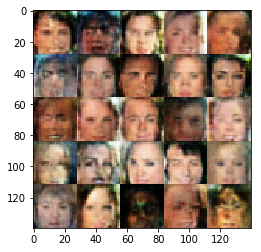

Epoch 1/25 Step 2500... Discriminator Loss: 0.9396... Generator Loss: 0.9897 ... Time spent=0.1282
Epoch 1/25 Step 2600... Discriminator Loss: 0.7621... Generator Loss: 1.3079 ... Time spent=0.1291


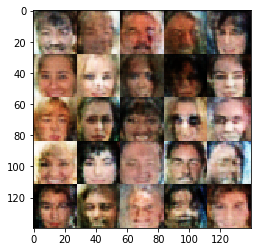

Epoch 1/25 Step 2700... Discriminator Loss: 2.4739... Generator Loss: 0.1947 ... Time spent=0.1288
Epoch 1/25 Step 2800... Discriminator Loss: 0.9534... Generator Loss: 0.9837 ... Time spent=0.1222


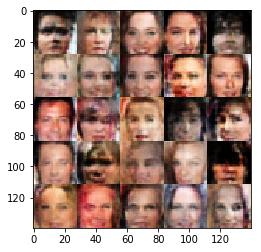

Epoch 1/25 Step 2900... Discriminator Loss: 0.7484... Generator Loss: 1.3495 ... Time spent=0.1211
Epoch 1/25 Step 3000... Discriminator Loss: 2.3914... Generator Loss: 0.2133 ... Time spent=0.1286


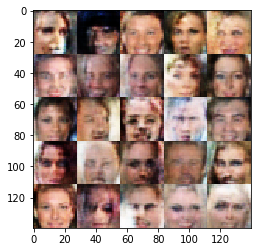

Epoch 1/25 Step 3100... Discriminator Loss: 1.0351... Generator Loss: 0.8271 ... Time spent=0.1304
Epoch 1/25 Step 3200... Discriminator Loss: 1.1177... Generator Loss: 0.8020 ... Time spent=0.1275


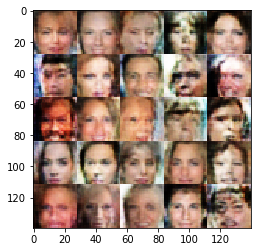

Epoch 1/25 Step 3300... Discriminator Loss: 1.2752... Generator Loss: 0.6888 ... Time spent=0.1310
Epoch 1/25 Step 3400... Discriminator Loss: 1.4098... Generator Loss: 0.6117 ... Time spent=0.1295


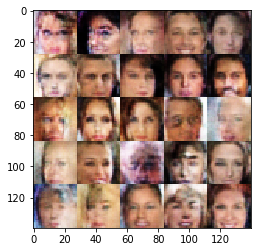

Epoch 1/25 Step 3500... Discriminator Loss: 0.7756... Generator Loss: 1.3721 ... Time spent=0.1305
Epoch 1/25 Step 3600... Discriminator Loss: 1.3798... Generator Loss: 0.6297 ... Time spent=0.1292


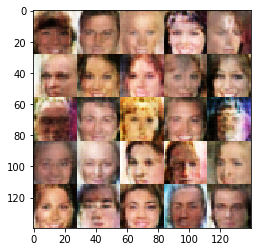

Epoch 1/25 Step 3700... Discriminator Loss: 0.9574... Generator Loss: 0.9951 ... Time spent=0.1291
Epoch 1/25 Step 3800... Discriminator Loss: 1.5447... Generator Loss: 0.4760 ... Time spent=0.1290


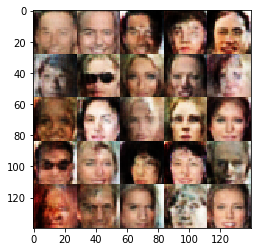

Epoch 1/25 Step 3900... Discriminator Loss: 0.9606... Generator Loss: 0.9814 ... Time spent=0.1289
Epoch 1/25 Step 4000... Discriminator Loss: 0.7772... Generator Loss: 1.7047 ... Time spent=0.1256


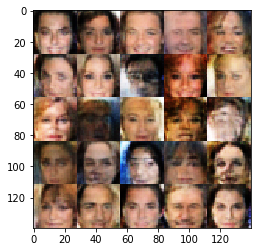

Epoch 1/25 Step 4100... Discriminator Loss: 1.3484... Generator Loss: 0.5932 ... Time spent=0.1263
Epoch 1/25 Step 4200... Discriminator Loss: 2.0249... Generator Loss: 0.3354 ... Time spent=0.1281


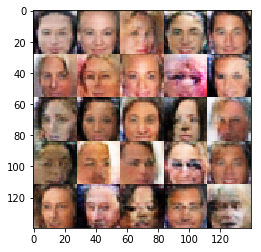

Epoch 1/25 Step 4300... Discriminator Loss: 1.6593... Generator Loss: 0.3916 ... Time spent=0.1307
Epoch 1/25 Step 4400... Discriminator Loss: 1.1843... Generator Loss: 0.7171 ... Time spent=0.1299


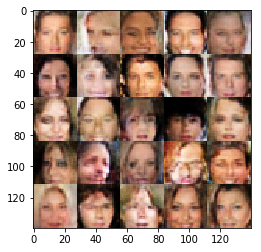

Epoch 1/25 Step 4500... Discriminator Loss: 1.6940... Generator Loss: 0.4017 ... Time spent=0.1293
Epoch 1/25 Step 4600... Discriminator Loss: 1.9719... Generator Loss: 0.3240 ... Time spent=0.1286


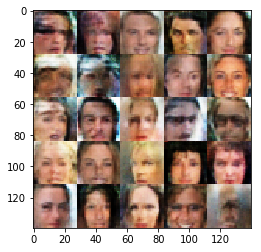

Epoch 1/25 Step 4700... Discriminator Loss: 0.8167... Generator Loss: 1.1887 ... Time spent=0.1294
Epoch 1/25 Step 4800... Discriminator Loss: 1.4871... Generator Loss: 0.5497 ... Time spent=0.1276


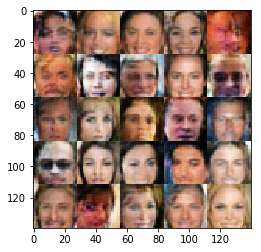

Epoch 1/25 Step 4900... Discriminator Loss: 0.7573... Generator Loss: 1.5212 ... Time spent=0.1283
Epoch 1/25 Step 5000... Discriminator Loss: 2.6277... Generator Loss: 0.1573 ... Time spent=0.1291


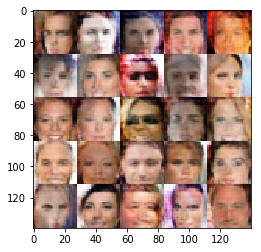

Epoch 1/25 Step 5100... Discriminator Loss: 1.0024... Generator Loss: 0.8867 ... Time spent=0.1300
Epoch 1/25 Step 5200... Discriminator Loss: 1.0803... Generator Loss: 0.7721 ... Time spent=0.1289


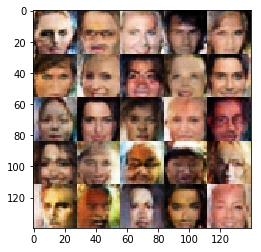

Epoch 1/25 Step 5300... Discriminator Loss: 0.7372... Generator Loss: 1.4548 ... Time spent=0.1287
Epoch 1/25 Step 5400... Discriminator Loss: 1.4239... Generator Loss: 0.5118 ... Time spent=0.1296


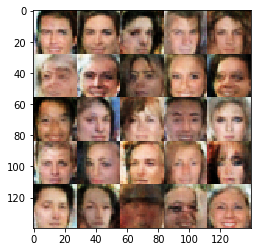

Epoch 1/25 Step 5500... Discriminator Loss: 1.7643... Generator Loss: 0.4077 ... Time spent=0.1289
Epoch 1/25 Step 5600... Discriminator Loss: 0.9026... Generator Loss: 1.0255 ... Time spent=0.1299


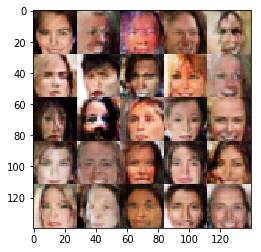

Epoch 1/25 Step 5700... Discriminator Loss: 1.6262... Generator Loss: 0.4511 ... Time spent=0.1293
Epoch 1/25 Step 5800... Discriminator Loss: 2.1828... Generator Loss: 0.3358 ... Time spent=0.1283


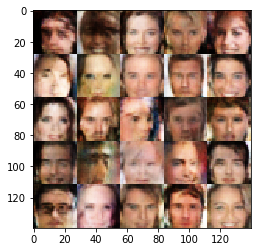

Epoch 1/25 Step 5900... Discriminator Loss: 1.0424... Generator Loss: 0.8502 ... Time spent=0.1284
Epoch 1/25 Step 6000... Discriminator Loss: 1.2541... Generator Loss: 0.6570 ... Time spent=0.1293


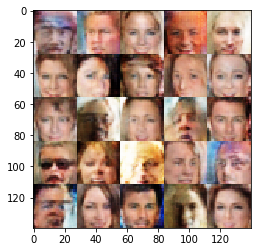

Epoch 1/25 Step 6100... Discriminator Loss: 0.8350... Generator Loss: 1.2990 ... Time spent=0.1289
Epoch 1/25 Step 6200... Discriminator Loss: 1.3438... Generator Loss: 0.6484 ... Time spent=0.1300


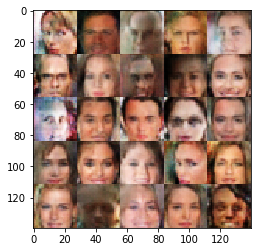

Epoch 1/25 Step 6300... Discriminator Loss: 1.1064... Generator Loss: 0.8046 ... Time spent=0.1282
Epoch 2/25 Step 6400... Discriminator Loss: 1.3982... Generator Loss: 0.5150 ... Time spent=0.0922


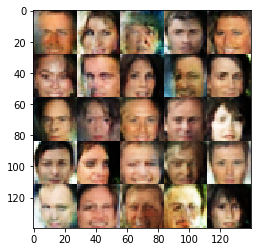

Epoch 2/25 Step 6500... Discriminator Loss: 1.2156... Generator Loss: 0.7516 ... Time spent=0.0926
Epoch 2/25 Step 6600... Discriminator Loss: 1.4477... Generator Loss: 0.4870 ... Time spent=0.0946


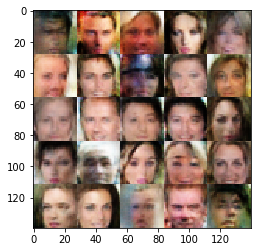

Epoch 2/25 Step 6700... Discriminator Loss: 1.0439... Generator Loss: 0.8019 ... Time spent=0.0912
Epoch 2/25 Step 6800... Discriminator Loss: 1.9471... Generator Loss: 0.2758 ... Time spent=0.0919


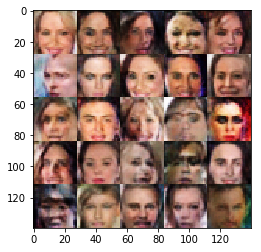

Epoch 2/25 Step 6900... Discriminator Loss: 1.1527... Generator Loss: 0.7731 ... Time spent=0.0922
Epoch 2/25 Step 7000... Discriminator Loss: 1.7622... Generator Loss: 0.4171 ... Time spent=0.0923


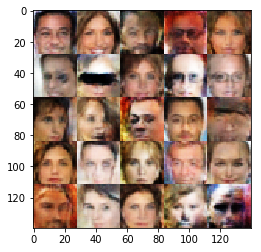

Epoch 2/25 Step 7100... Discriminator Loss: 2.7374... Generator Loss: 0.2159 ... Time spent=0.0929
Epoch 2/25 Step 7200... Discriminator Loss: 1.6948... Generator Loss: 0.4100 ... Time spent=0.0922


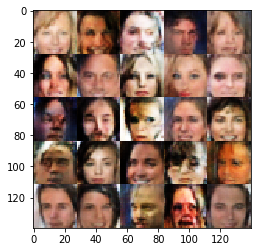

Epoch 2/25 Step 7300... Discriminator Loss: 2.0063... Generator Loss: 0.2725 ... Time spent=0.0932
Epoch 2/25 Step 7400... Discriminator Loss: 1.0377... Generator Loss: 0.8951 ... Time spent=0.0925


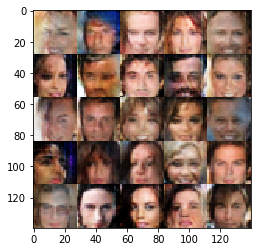

Epoch 2/25 Step 7500... Discriminator Loss: 1.4401... Generator Loss: 0.5553 ... Time spent=0.0908
Epoch 2/25 Step 7600... Discriminator Loss: 1.8407... Generator Loss: 0.3796 ... Time spent=0.0920


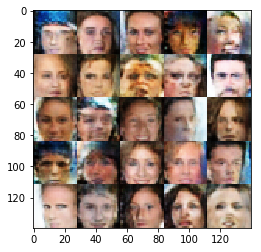

Epoch 2/25 Step 7700... Discriminator Loss: 0.9312... Generator Loss: 0.9627 ... Time spent=0.0910
Epoch 2/25 Step 7800... Discriminator Loss: 0.9443... Generator Loss: 0.9936 ... Time spent=0.0919


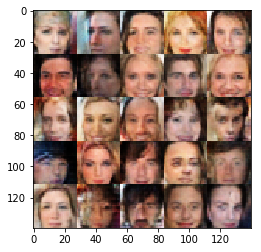

Epoch 2/25 Step 7900... Discriminator Loss: 2.0865... Generator Loss: 0.2903 ... Time spent=0.0919
Epoch 2/25 Step 8000... Discriminator Loss: 1.3756... Generator Loss: 0.5512 ... Time spent=0.0931


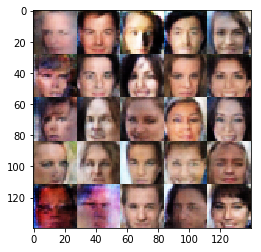

Epoch 2/25 Step 8100... Discriminator Loss: 1.3306... Generator Loss: 0.7599 ... Time spent=0.0924
Epoch 2/25 Step 8200... Discriminator Loss: 1.0701... Generator Loss: 0.8975 ... Time spent=0.0921


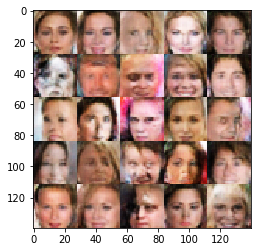

Epoch 2/25 Step 8300... Discriminator Loss: 1.3605... Generator Loss: 0.6726 ... Time spent=0.0919
Epoch 2/25 Step 8400... Discriminator Loss: 1.5476... Generator Loss: 0.4567 ... Time spent=0.0921


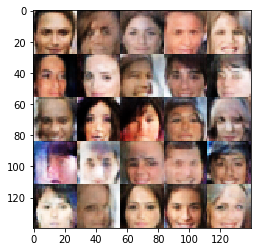

Epoch 2/25 Step 8500... Discriminator Loss: 2.4952... Generator Loss: 0.2062 ... Time spent=0.0921
Epoch 2/25 Step 8600... Discriminator Loss: 0.9397... Generator Loss: 1.0289 ... Time spent=0.0913


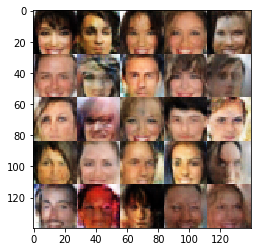

Epoch 2/25 Step 8700... Discriminator Loss: 1.1652... Generator Loss: 0.7692 ... Time spent=0.0910
Epoch 2/25 Step 8800... Discriminator Loss: 0.9549... Generator Loss: 1.0276 ... Time spent=0.0929


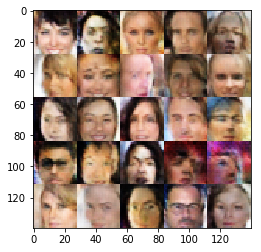

Epoch 2/25 Step 8900... Discriminator Loss: 1.0100... Generator Loss: 0.9206 ... Time spent=0.0925
Epoch 2/25 Step 9000... Discriminator Loss: 2.5161... Generator Loss: 0.2048 ... Time spent=0.0931


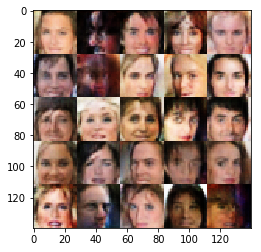

Epoch 2/25 Step 9100... Discriminator Loss: 0.9922... Generator Loss: 0.8995 ... Time spent=0.0921
Epoch 2/25 Step 9200... Discriminator Loss: 1.4524... Generator Loss: 0.5303 ... Time spent=0.0911


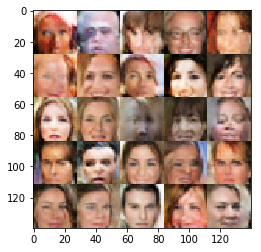

Epoch 2/25 Step 9300... Discriminator Loss: 0.9341... Generator Loss: 0.8982 ... Time spent=0.0910
Epoch 2/25 Step 9400... Discriminator Loss: 1.2751... Generator Loss: 0.6820 ... Time spent=0.0924


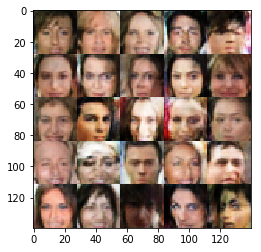

Epoch 2/25 Step 9500... Discriminator Loss: 0.7201... Generator Loss: 1.8754 ... Time spent=0.0914
Epoch 2/25 Step 9600... Discriminator Loss: 1.5224... Generator Loss: 0.5044 ... Time spent=0.0917


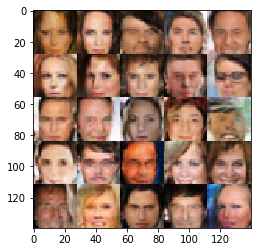

Epoch 2/25 Step 9700... Discriminator Loss: 1.0084... Generator Loss: 0.9265 ... Time spent=0.0920
Epoch 2/25 Step 9800... Discriminator Loss: 1.2116... Generator Loss: 0.6393 ... Time spent=0.0925


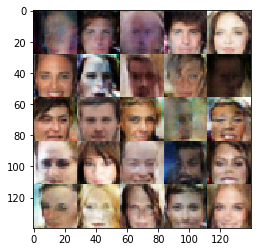

Epoch 2/25 Step 9900... Discriminator Loss: 1.7330... Generator Loss: 0.3913 ... Time spent=0.0923
Epoch 2/25 Step 10000... Discriminator Loss: 1.0789... Generator Loss: 0.8212 ... Time spent=0.0927


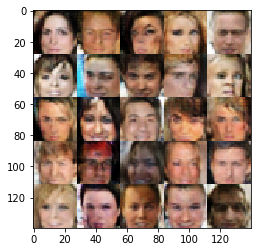

Epoch 2/25 Step 10100... Discriminator Loss: 0.8181... Generator Loss: 1.3098 ... Time spent=0.0906
Epoch 2/25 Step 10200... Discriminator Loss: 1.2725... Generator Loss: 0.6371 ... Time spent=0.0932


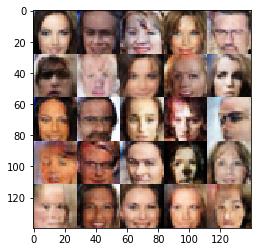

Epoch 2/25 Step 10300... Discriminator Loss: 1.1617... Generator Loss: 0.7271 ... Time spent=0.0910
Epoch 2/25 Step 10400... Discriminator Loss: 1.5676... Generator Loss: 0.4782 ... Time spent=0.0930


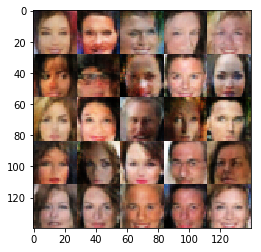

Epoch 2/25 Step 10500... Discriminator Loss: 1.4079... Generator Loss: 0.6285 ... Time spent=0.0917
Epoch 2/25 Step 10600... Discriminator Loss: 1.4828... Generator Loss: 0.5512 ... Time spent=0.0938


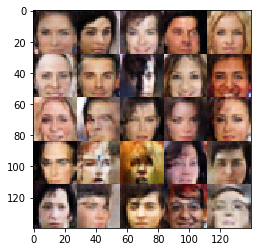

Epoch 2/25 Step 10700... Discriminator Loss: 1.9954... Generator Loss: 0.3461 ... Time spent=0.0917
Epoch 2/25 Step 10800... Discriminator Loss: 1.5144... Generator Loss: 0.5805 ... Time spent=0.0921


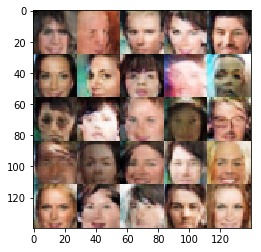

Epoch 2/25 Step 10900... Discriminator Loss: 2.1640... Generator Loss: 0.3155 ... Time spent=0.0934
Epoch 2/25 Step 11000... Discriminator Loss: 2.0224... Generator Loss: 0.2999 ... Time spent=0.0914


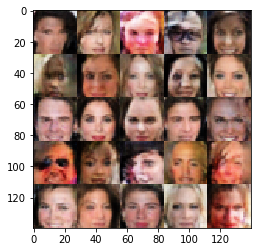

Epoch 2/25 Step 11100... Discriminator Loss: 1.7442... Generator Loss: 6.0772 ... Time spent=0.0919
Epoch 2/25 Step 11200... Discriminator Loss: 1.6634... Generator Loss: 0.4839 ... Time spent=0.0926


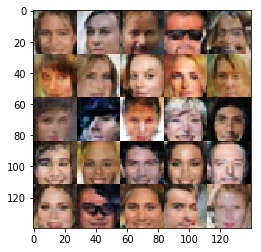

Epoch 2/25 Step 11300... Discriminator Loss: 0.8524... Generator Loss: 1.1177 ... Time spent=0.0918
Epoch 2/25 Step 11400... Discriminator Loss: 1.7226... Generator Loss: 0.4372 ... Time spent=0.0919


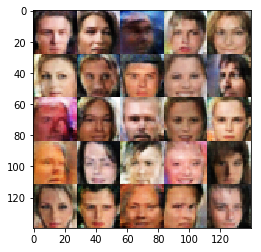

Epoch 2/25 Step 11500... Discriminator Loss: 0.9331... Generator Loss: 0.9144 ... Time spent=0.0920
Epoch 2/25 Step 11600... Discriminator Loss: 3.0746... Generator Loss: 0.1126 ... Time spent=0.0920


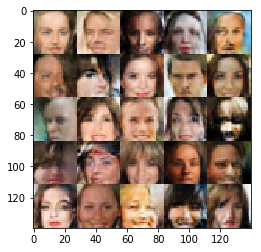

Epoch 2/25 Step 11700... Discriminator Loss: 0.7471... Generator Loss: 1.6236 ... Time spent=0.0908
Epoch 2/25 Step 11800... Discriminator Loss: 1.9637... Generator Loss: 0.3555 ... Time spent=0.0933


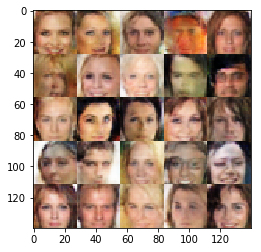

Epoch 2/25 Step 11900... Discriminator Loss: 1.6503... Generator Loss: 0.4822 ... Time spent=0.0912
Epoch 2/25 Step 12000... Discriminator Loss: 0.7443... Generator Loss: 1.3795 ... Time spent=0.0903


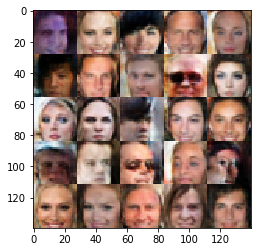

Epoch 2/25 Step 12100... Discriminator Loss: 1.8071... Generator Loss: 0.4158 ... Time spent=0.0931
Epoch 2/25 Step 12200... Discriminator Loss: 1.7121... Generator Loss: 0.3745 ... Time spent=0.0932


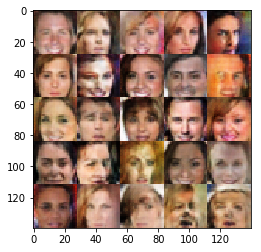

Epoch 2/25 Step 12300... Discriminator Loss: 0.6038... Generator Loss: 3.0724 ... Time spent=0.0915
Epoch 2/25 Step 12400... Discriminator Loss: 0.8789... Generator Loss: 1.1575 ... Time spent=0.0916


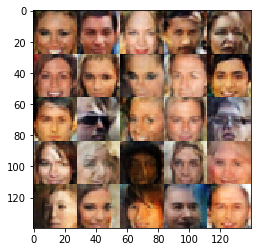

Epoch 2/25 Step 12500... Discriminator Loss: 1.0172... Generator Loss: 4.0598 ... Time spent=0.0912
Epoch 2/25 Step 12600... Discriminator Loss: 0.8141... Generator Loss: 1.3404 ... Time spent=0.0918


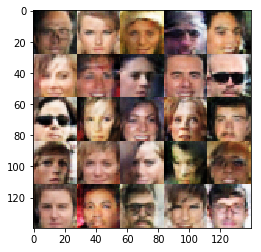

Epoch 3/25 Step 12700... Discriminator Loss: 0.9090... Generator Loss: 1.1185 ... Time spent=0.0918
Epoch 3/25 Step 12800... Discriminator Loss: 1.0748... Generator Loss: 0.8261 ... Time spent=0.0936


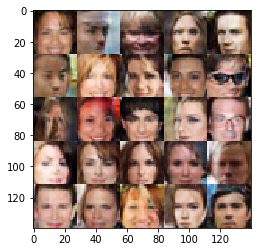

Epoch 3/25 Step 12900... Discriminator Loss: 1.0041... Generator Loss: 1.0109 ... Time spent=0.0918
Epoch 3/25 Step 13000... Discriminator Loss: 1.0520... Generator Loss: 0.9256 ... Time spent=0.0928


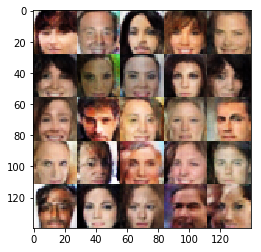

Epoch 3/25 Step 13100... Discriminator Loss: 0.9501... Generator Loss: 0.8878 ... Time spent=0.0923
Epoch 3/25 Step 13200... Discriminator Loss: 0.7882... Generator Loss: 2.0621 ... Time spent=0.0924


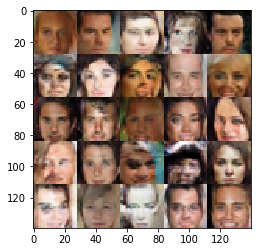

Epoch 3/25 Step 13300... Discriminator Loss: 0.8218... Generator Loss: 1.2378 ... Time spent=0.0907
Epoch 3/25 Step 13400... Discriminator Loss: 0.9248... Generator Loss: 1.0717 ... Time spent=0.0919


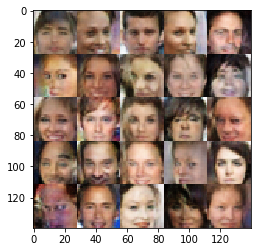

Epoch 3/25 Step 13500... Discriminator Loss: 2.2612... Generator Loss: 0.2945 ... Time spent=0.0915
Epoch 3/25 Step 13600... Discriminator Loss: 0.8815... Generator Loss: 1.0056 ... Time spent=0.0925


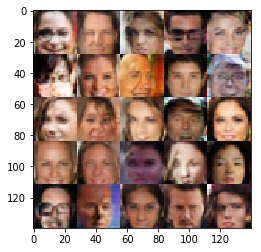

Epoch 3/25 Step 13700... Discriminator Loss: 1.3938... Generator Loss: 0.4931 ... Time spent=0.0917
Epoch 3/25 Step 13800... Discriminator Loss: 0.8475... Generator Loss: 1.3958 ... Time spent=0.0906


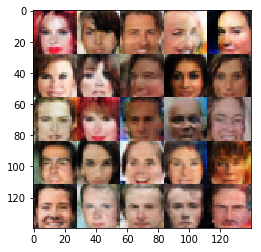

Epoch 3/25 Step 13900... Discriminator Loss: 2.1678... Generator Loss: 0.3533 ... Time spent=0.0912
Epoch 3/25 Step 14000... Discriminator Loss: 1.3574... Generator Loss: 0.6111 ... Time spent=0.0928


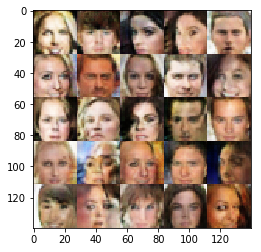

Epoch 3/25 Step 14100... Discriminator Loss: 0.9847... Generator Loss: 1.0652 ... Time spent=0.0930
Epoch 3/25 Step 14200... Discriminator Loss: 2.0209... Generator Loss: 0.3712 ... Time spent=0.0917


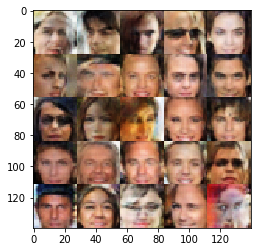

Epoch 3/25 Step 14300... Discriminator Loss: 2.7251... Generator Loss: 0.1954 ... Time spent=0.0912
Epoch 3/25 Step 14400... Discriminator Loss: 1.6485... Generator Loss: 0.4781 ... Time spent=0.0924


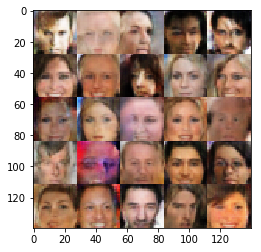

Epoch 3/25 Step 14500... Discriminator Loss: 1.9298... Generator Loss: 0.2913 ... Time spent=0.0918
Epoch 3/25 Step 14600... Discriminator Loss: 1.8288... Generator Loss: 0.4008 ... Time spent=0.0919


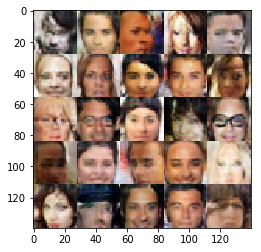

Epoch 3/25 Step 14700... Discriminator Loss: 1.7444... Generator Loss: 0.5617 ... Time spent=0.0920
Epoch 3/25 Step 14800... Discriminator Loss: 3.2317... Generator Loss: 0.1475 ... Time spent=0.0933


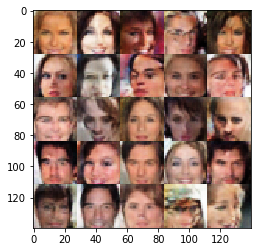

Epoch 3/25 Step 14900... Discriminator Loss: 1.9113... Generator Loss: 0.3346 ... Time spent=0.0922
Epoch 3/25 Step 15000... Discriminator Loss: 0.6630... Generator Loss: 1.8126 ... Time spent=0.0920


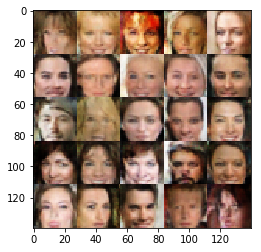

Epoch 3/25 Step 15100... Discriminator Loss: 1.1411... Generator Loss: 0.7533 ... Time spent=0.0919
Epoch 3/25 Step 15200... Discriminator Loss: 1.2998... Generator Loss: 0.7158 ... Time spent=0.0920


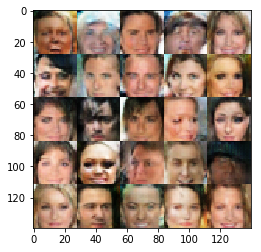

Epoch 3/25 Step 15300... Discriminator Loss: 1.2258... Generator Loss: 0.6331 ... Time spent=0.0917
Epoch 3/25 Step 15400... Discriminator Loss: 0.6832... Generator Loss: 1.6009 ... Time spent=0.0926


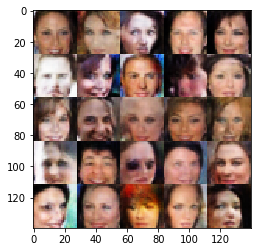

Epoch 3/25 Step 15500... Discriminator Loss: 1.9284... Generator Loss: 0.3221 ... Time spent=0.0918
Epoch 3/25 Step 15600... Discriminator Loss: 1.1820... Generator Loss: 0.7664 ... Time spent=0.0935


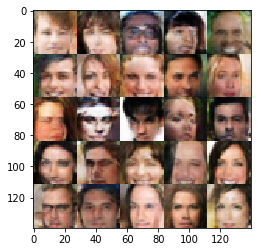

Epoch 3/25 Step 15700... Discriminator Loss: 2.6670... Generator Loss: 0.1938 ... Time spent=0.0911
Epoch 3/25 Step 15800... Discriminator Loss: 1.3060... Generator Loss: 0.6546 ... Time spent=0.0924


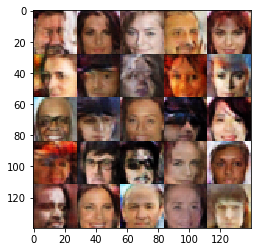

Epoch 3/25 Step 15900... Discriminator Loss: 0.9847... Generator Loss: 0.9328 ... Time spent=0.0922
Epoch 3/25 Step 16000... Discriminator Loss: 0.7956... Generator Loss: 1.2840 ... Time spent=0.0927


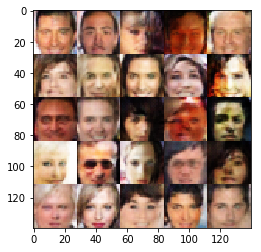

Epoch 3/25 Step 16100... Discriminator Loss: 1.2744... Generator Loss: 0.6413 ... Time spent=0.0910
Epoch 3/25 Step 16200... Discriminator Loss: 0.8843... Generator Loss: 1.0706 ... Time spent=0.0933


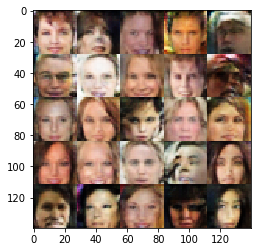

Epoch 3/25 Step 16300... Discriminator Loss: 2.0354... Generator Loss: 0.3088 ... Time spent=0.0934
Epoch 3/25 Step 16400... Discriminator Loss: 0.6376... Generator Loss: 1.8054 ... Time spent=0.0917


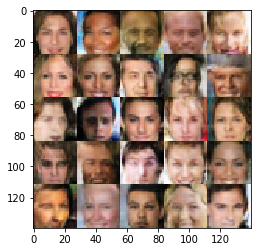

Epoch 3/25 Step 16500... Discriminator Loss: 0.9078... Generator Loss: 1.1477 ... Time spent=0.0921
Epoch 3/25 Step 16600... Discriminator Loss: 2.6366... Generator Loss: 0.2112 ... Time spent=0.0928


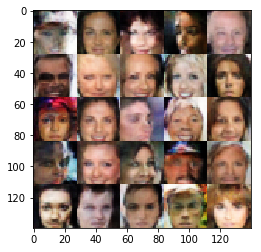

Epoch 3/25 Step 16700... Discriminator Loss: 1.1996... Generator Loss: 0.6593 ... Time spent=0.0911
Epoch 3/25 Step 16800... Discriminator Loss: 0.9034... Generator Loss: 1.5236 ... Time spent=0.0927


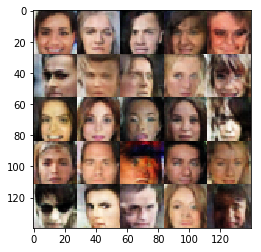

Epoch 3/25 Step 16900... Discriminator Loss: 0.6438... Generator Loss: 1.8226 ... Time spent=0.0917
Epoch 3/25 Step 17000... Discriminator Loss: 2.0662... Generator Loss: 0.3225 ... Time spent=0.0907


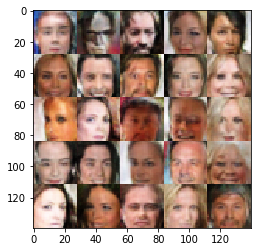

Epoch 3/25 Step 17100... Discriminator Loss: 0.6166... Generator Loss: 2.4871 ... Time spent=0.0926
Epoch 3/25 Step 17200... Discriminator Loss: 0.6204... Generator Loss: 1.9913 ... Time spent=0.0927


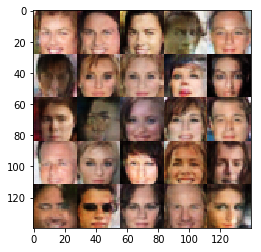

Epoch 3/25 Step 17300... Discriminator Loss: 1.4356... Generator Loss: 0.5697 ... Time spent=0.0904
Epoch 3/25 Step 17400... Discriminator Loss: 0.8050... Generator Loss: 1.1758 ... Time spent=0.0935


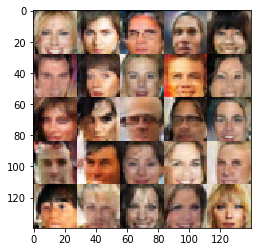

Epoch 3/25 Step 17500... Discriminator Loss: 2.8184... Generator Loss: 0.1566 ... Time spent=0.0922
Epoch 3/25 Step 17600... Discriminator Loss: 1.0772... Generator Loss: 0.8557 ... Time spent=0.0916


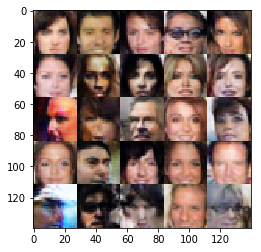

Epoch 3/25 Step 17700... Discriminator Loss: 1.2464... Generator Loss: 0.6295 ... Time spent=0.0912
Epoch 3/25 Step 17800... Discriminator Loss: 0.8405... Generator Loss: 4.0859 ... Time spent=0.0931


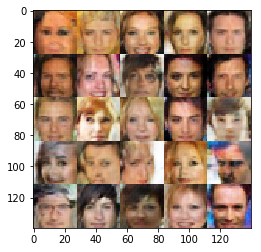

Epoch 3/25 Step 17900... Discriminator Loss: 0.8203... Generator Loss: 1.1902 ... Time spent=0.0921
Epoch 3/25 Step 18000... Discriminator Loss: 2.3421... Generator Loss: 0.2737 ... Time spent=0.0906


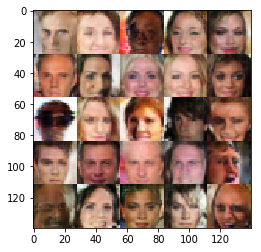

Epoch 3/25 Step 18100... Discriminator Loss: 2.3384... Generator Loss: 0.2699 ... Time spent=0.0909
Epoch 3/25 Step 18200... Discriminator Loss: 1.2883... Generator Loss: 0.6701 ... Time spent=0.0917


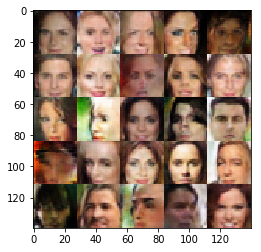

Epoch 3/25 Step 18300... Discriminator Loss: 1.0766... Generator Loss: 0.8891 ... Time spent=0.0936
Epoch 3/25 Step 18400... Discriminator Loss: 1.4652... Generator Loss: 0.4647 ... Time spent=0.0922


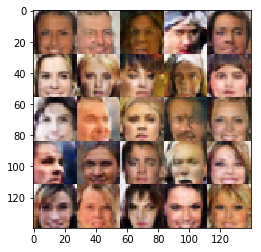

Epoch 3/25 Step 18500... Discriminator Loss: 0.9438... Generator Loss: 0.9684 ... Time spent=0.0901
Epoch 3/25 Step 18600... Discriminator Loss: 0.9778... Generator Loss: 0.9627 ... Time spent=0.0916


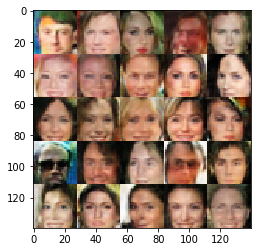

Epoch 3/25 Step 18700... Discriminator Loss: 0.9423... Generator Loss: 0.9408 ... Time spent=0.0912
Epoch 3/25 Step 18800... Discriminator Loss: 0.6348... Generator Loss: 2.4919 ... Time spent=0.0895


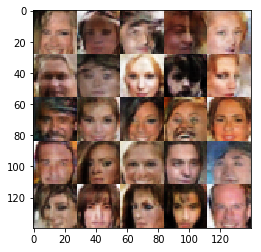

Epoch 3/25 Step 18900... Discriminator Loss: 3.0243... Generator Loss: 0.1828 ... Time spent=0.0932
Epoch 4/25 Step 19000... Discriminator Loss: 1.3896... Generator Loss: 0.5315 ... Time spent=0.0911


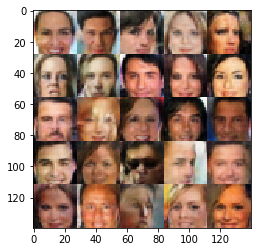

Epoch 4/25 Step 19100... Discriminator Loss: 1.3147... Generator Loss: 0.6360 ... Time spent=0.0918
Epoch 4/25 Step 19200... Discriminator Loss: 1.5694... Generator Loss: 0.4882 ... Time spent=0.0921


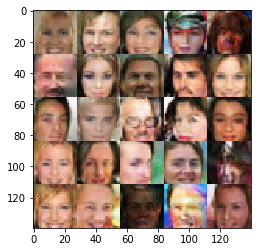

Epoch 4/25 Step 19300... Discriminator Loss: 0.8624... Generator Loss: 1.2374 ... Time spent=0.0941
Epoch 4/25 Step 19400... Discriminator Loss: 0.8874... Generator Loss: 1.0524 ... Time spent=0.0921


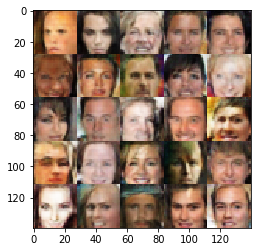

Epoch 4/25 Step 19500... Discriminator Loss: 0.7185... Generator Loss: 2.0057 ... Time spent=0.0916
Epoch 4/25 Step 19600... Discriminator Loss: 1.7931... Generator Loss: 0.3607 ... Time spent=0.0925


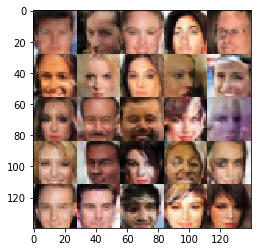

Epoch 4/25 Step 19700... Discriminator Loss: 2.9786... Generator Loss: 0.1427 ... Time spent=0.0913
Epoch 4/25 Step 19800... Discriminator Loss: 1.1580... Generator Loss: 0.7672 ... Time spent=0.0925


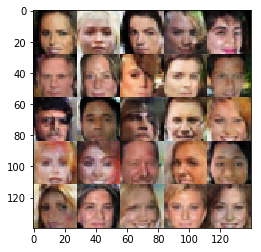

Epoch 4/25 Step 19900... Discriminator Loss: 1.7833... Generator Loss: 0.4286 ... Time spent=0.0932
Epoch 4/25 Step 20000... Discriminator Loss: 0.8800... Generator Loss: 3.3462 ... Time spent=0.0922


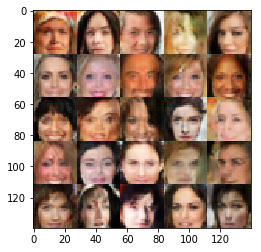

Epoch 4/25 Step 20100... Discriminator Loss: 1.1139... Generator Loss: 0.8440 ... Time spent=0.0940
Epoch 4/25 Step 20200... Discriminator Loss: 0.8412... Generator Loss: 1.1332 ... Time spent=0.0918


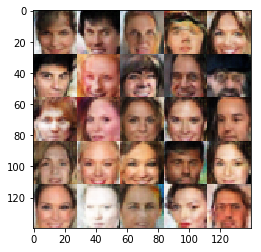

Epoch 4/25 Step 20300... Discriminator Loss: 2.1065... Generator Loss: 0.3519 ... Time spent=0.0926
Epoch 4/25 Step 20400... Discriminator Loss: 1.1588... Generator Loss: 0.7205 ... Time spent=0.0929


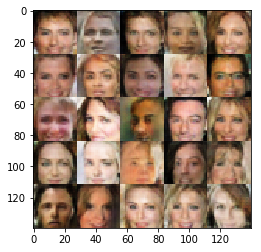

Epoch 4/25 Step 20500... Discriminator Loss: 0.9827... Generator Loss: 0.9243 ... Time spent=0.0928
Epoch 4/25 Step 20600... Discriminator Loss: 0.6389... Generator Loss: 1.6799 ... Time spent=0.0909


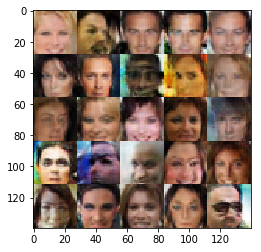

Epoch 4/25 Step 20700... Discriminator Loss: 1.9505... Generator Loss: 0.3192 ... Time spent=0.0912
Epoch 4/25 Step 20800... Discriminator Loss: 0.9674... Generator Loss: 0.9499 ... Time spent=0.0917


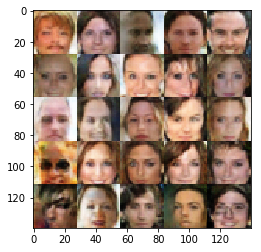

Epoch 4/25 Step 20900... Discriminator Loss: 0.7498... Generator Loss: 1.2453 ... Time spent=0.0932
Epoch 4/25 Step 21000... Discriminator Loss: 0.7512... Generator Loss: 1.4312 ... Time spent=0.0926


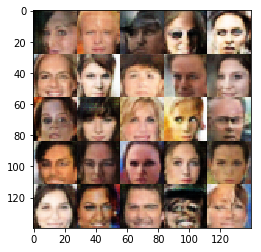

Epoch 4/25 Step 21100... Discriminator Loss: 3.1688... Generator Loss: 0.1455 ... Time spent=0.0929
Epoch 4/25 Step 21200... Discriminator Loss: 1.0571... Generator Loss: 0.8284 ... Time spent=0.0918


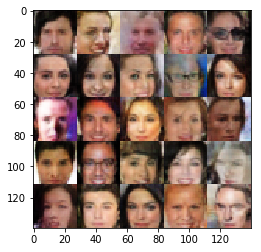

Epoch 4/25 Step 21300... Discriminator Loss: 1.5233... Generator Loss: 0.5476 ... Time spent=0.0923
Epoch 4/25 Step 21400... Discriminator Loss: 1.0252... Generator Loss: 0.8737 ... Time spent=0.0926


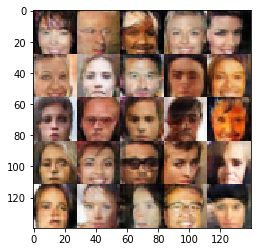

Epoch 4/25 Step 21500... Discriminator Loss: 0.5829... Generator Loss: 1.8865 ... Time spent=0.0919
Epoch 4/25 Step 21600... Discriminator Loss: 0.8080... Generator Loss: 1.1913 ... Time spent=0.0927


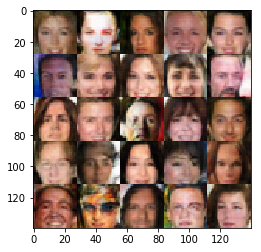

Epoch 4/25 Step 21700... Discriminator Loss: 1.7238... Generator Loss: 0.3639 ... Time spent=0.0923
Epoch 4/25 Step 21800... Discriminator Loss: 1.0935... Generator Loss: 0.8067 ... Time spent=0.0927


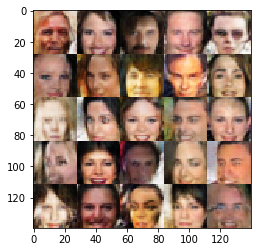

Epoch 4/25 Step 21900... Discriminator Loss: 1.1337... Generator Loss: 0.7272 ... Time spent=0.0929
Epoch 4/25 Step 22000... Discriminator Loss: 1.0224... Generator Loss: 0.8696 ... Time spent=0.0929


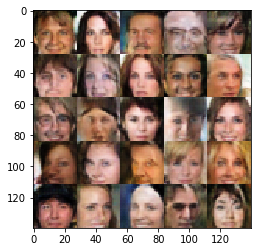

Epoch 4/25 Step 22100... Discriminator Loss: 1.0526... Generator Loss: 2.2943 ... Time spent=0.0925
Epoch 4/25 Step 22200... Discriminator Loss: 2.0140... Generator Loss: 0.3378 ... Time spent=0.0926


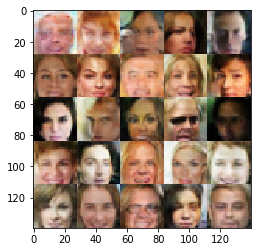

Epoch 4/25 Step 22300... Discriminator Loss: 0.9404... Generator Loss: 1.0219 ... Time spent=0.0919
Epoch 4/25 Step 22400... Discriminator Loss: 0.7422... Generator Loss: 1.2670 ... Time spent=0.0929


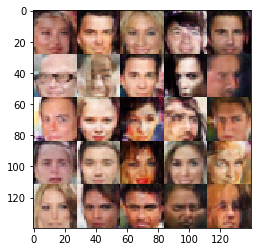

Epoch 4/25 Step 22500... Discriminator Loss: 0.8500... Generator Loss: 1.1285 ... Time spent=0.0939
Epoch 4/25 Step 22600... Discriminator Loss: 1.1857... Generator Loss: 4.2711 ... Time spent=0.0922


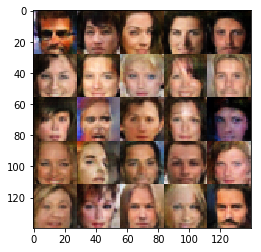

Epoch 4/25 Step 22700... Discriminator Loss: 0.7124... Generator Loss: 1.6101 ... Time spent=0.0922
Epoch 4/25 Step 22800... Discriminator Loss: 0.8239... Generator Loss: 1.4858 ... Time spent=0.0924


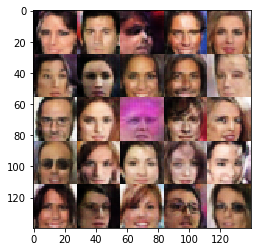

Epoch 4/25 Step 22900... Discriminator Loss: 1.0166... Generator Loss: 0.9073 ... Time spent=0.0925
Epoch 4/25 Step 23000... Discriminator Loss: 1.1156... Generator Loss: 0.8136 ... Time spent=0.0910


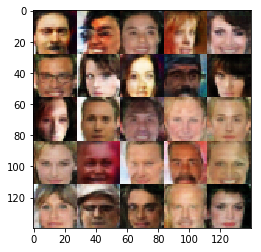

Epoch 4/25 Step 23100... Discriminator Loss: 0.9290... Generator Loss: 1.0672 ... Time spent=0.0937
Epoch 4/25 Step 23200... Discriminator Loss: 1.9796... Generator Loss: 0.3776 ... Time spent=0.0927


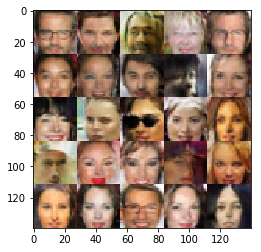

Epoch 4/25 Step 23300... Discriminator Loss: 2.9266... Generator Loss: 0.1752 ... Time spent=0.0923
Epoch 4/25 Step 23400... Discriminator Loss: 1.0386... Generator Loss: 0.8153 ... Time spent=0.0934


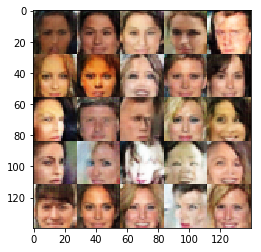

Epoch 4/25 Step 23500... Discriminator Loss: 2.6445... Generator Loss: 0.2707 ... Time spent=0.0921
Epoch 4/25 Step 23600... Discriminator Loss: 2.9371... Generator Loss: 0.1595 ... Time spent=0.0917


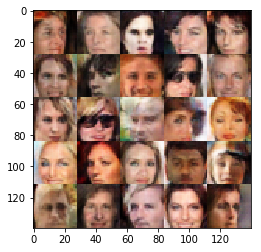

Epoch 4/25 Step 23700... Discriminator Loss: 2.4439... Generator Loss: 0.3202 ... Time spent=0.0919
Epoch 4/25 Step 23800... Discriminator Loss: 1.1528... Generator Loss: 0.6943 ... Time spent=0.0926


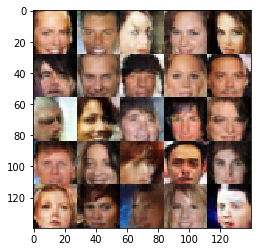

Epoch 4/25 Step 23900... Discriminator Loss: 1.3820... Generator Loss: 0.6319 ... Time spent=0.0951
Epoch 4/25 Step 24000... Discriminator Loss: 0.7367... Generator Loss: 1.3700 ... Time spent=0.0915


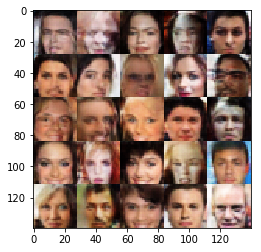

Epoch 4/25 Step 24100... Discriminator Loss: 0.5370... Generator Loss: 2.6990 ... Time spent=0.0920
Epoch 4/25 Step 24200... Discriminator Loss: 0.9769... Generator Loss: 0.9993 ... Time spent=0.0928


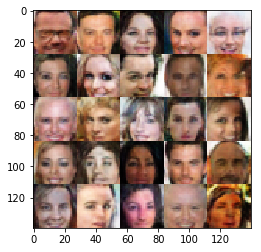

Epoch 4/25 Step 24300... Discriminator Loss: 0.7425... Generator Loss: 1.8035 ... Time spent=0.0937
Epoch 4/25 Step 24400... Discriminator Loss: 0.7858... Generator Loss: 1.3902 ... Time spent=0.0914


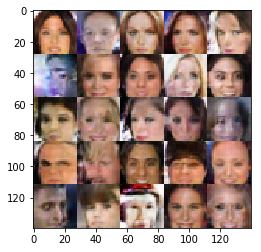

Epoch 4/25 Step 24500... Discriminator Loss: 0.7761... Generator Loss: 2.0424 ... Time spent=0.0925
Epoch 4/25 Step 24600... Discriminator Loss: 1.3323... Generator Loss: 0.6620 ... Time spent=0.0924


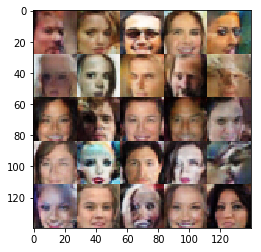

Epoch 4/25 Step 24700... Discriminator Loss: 0.7545... Generator Loss: 1.2749 ... Time spent=0.0924
Epoch 4/25 Step 24800... Discriminator Loss: 1.1153... Generator Loss: 0.8681 ... Time spent=0.0921


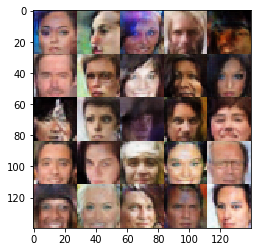

Epoch 4/25 Step 24900... Discriminator Loss: 2.1209... Generator Loss: 0.4487 ... Time spent=0.0923
Epoch 4/25 Step 25000... Discriminator Loss: 0.9582... Generator Loss: 0.9739 ... Time spent=0.0912


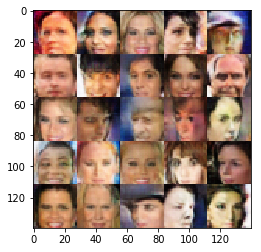

Epoch 4/25 Step 25100... Discriminator Loss: 0.9861... Generator Loss: 0.9426 ... Time spent=0.0920
Epoch 4/25 Step 25200... Discriminator Loss: 0.8536... Generator Loss: 1.1680 ... Time spent=0.0931


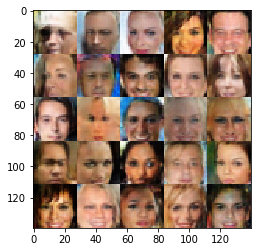

Epoch 4/25 Step 25300... Discriminator Loss: 1.7630... Generator Loss: 0.4512 ... Time spent=0.0932
Epoch 5/25 Step 25400... Discriminator Loss: 0.8787... Generator Loss: 1.0724 ... Time spent=0.0921


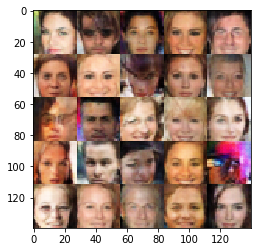

Epoch 5/25 Step 25500... Discriminator Loss: 1.1013... Generator Loss: 0.8114 ... Time spent=0.0923
Epoch 5/25 Step 25600... Discriminator Loss: 1.0099... Generator Loss: 0.9021 ... Time spent=0.0934


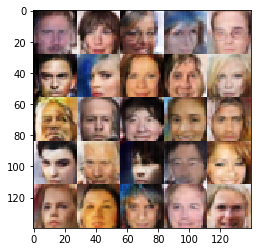

Epoch 5/25 Step 25700... Discriminator Loss: 0.5579... Generator Loss: 2.0460 ... Time spent=0.0923
Epoch 5/25 Step 25800... Discriminator Loss: 1.0391... Generator Loss: 0.7986 ... Time spent=0.0919


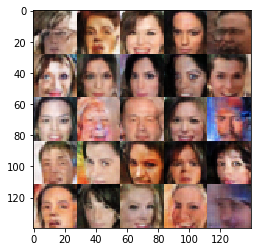

Epoch 5/25 Step 25900... Discriminator Loss: 2.3660... Generator Loss: 0.2573 ... Time spent=0.0917
Epoch 5/25 Step 26000... Discriminator Loss: 2.9950... Generator Loss: 6.8755 ... Time spent=0.0912


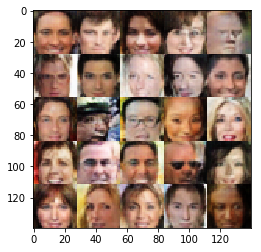

Epoch 5/25 Step 26100... Discriminator Loss: 0.9105... Generator Loss: 0.9375 ... Time spent=0.0926
Epoch 5/25 Step 26200... Discriminator Loss: 0.8689... Generator Loss: 4.1350 ... Time spent=0.0922


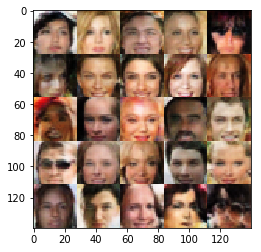

Epoch 5/25 Step 26300... Discriminator Loss: 0.6559... Generator Loss: 1.6034 ... Time spent=0.0917
Epoch 5/25 Step 26400... Discriminator Loss: 1.4050... Generator Loss: 0.7986 ... Time spent=0.0921


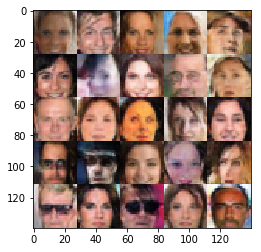

Epoch 5/25 Step 26500... Discriminator Loss: 0.5306... Generator Loss: 2.3398 ... Time spent=0.0921
Epoch 5/25 Step 26600... Discriminator Loss: 1.7201... Generator Loss: 0.4902 ... Time spent=0.0920


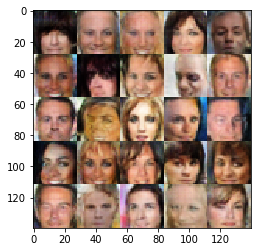

Epoch 5/25 Step 26700... Discriminator Loss: 0.5939... Generator Loss: 1.8300 ... Time spent=0.0908
Epoch 5/25 Step 26800... Discriminator Loss: 0.7426... Generator Loss: 1.4746 ... Time spent=0.0938


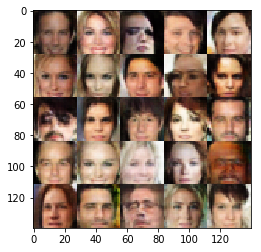

Epoch 5/25 Step 26900... Discriminator Loss: 2.0645... Generator Loss: 0.3205 ... Time spent=0.0927
Epoch 5/25 Step 27000... Discriminator Loss: 0.8461... Generator Loss: 1.1430 ... Time spent=0.0940


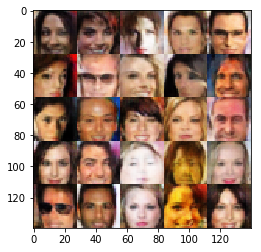

Epoch 5/25 Step 27100... Discriminator Loss: 2.3408... Generator Loss: 0.2411 ... Time spent=0.0922
Epoch 5/25 Step 27200... Discriminator Loss: 1.1936... Generator Loss: 0.8767 ... Time spent=0.0913


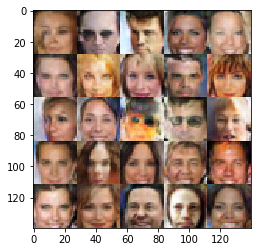

Epoch 5/25 Step 27300... Discriminator Loss: 0.8967... Generator Loss: 1.1279 ... Time spent=0.0921
Epoch 5/25 Step 27400... Discriminator Loss: 0.7594... Generator Loss: 1.3676 ... Time spent=0.0925


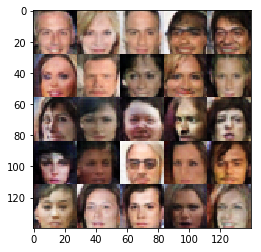

Epoch 5/25 Step 27500... Discriminator Loss: 0.7201... Generator Loss: 1.4401 ... Time spent=0.0917
Epoch 5/25 Step 27600... Discriminator Loss: 1.0867... Generator Loss: 0.8076 ... Time spent=0.0931


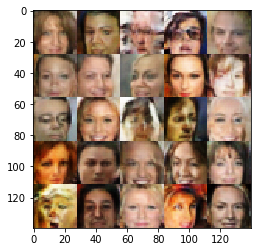

Epoch 5/25 Step 27700... Discriminator Loss: 0.7499... Generator Loss: 1.2313 ... Time spent=0.0913
Epoch 5/25 Step 27800... Discriminator Loss: 0.5196... Generator Loss: 2.4595 ... Time spent=0.0931


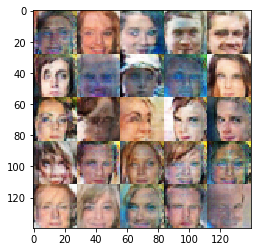

Epoch 5/25 Step 27900... Discriminator Loss: 1.1124... Generator Loss: 0.7557 ... Time spent=0.0916
Epoch 5/25 Step 28000... Discriminator Loss: 0.6996... Generator Loss: 1.5890 ... Time spent=0.0930


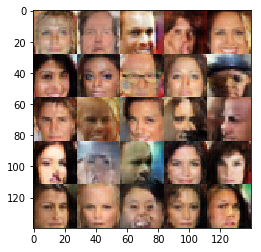

Epoch 5/25 Step 28100... Discriminator Loss: 0.9581... Generator Loss: 0.8866 ... Time spent=0.0916
Epoch 5/25 Step 28200... Discriminator Loss: 0.6700... Generator Loss: 2.8965 ... Time spent=0.0929


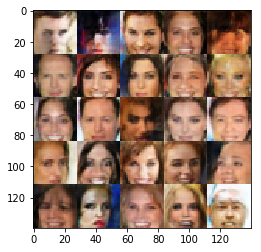

Epoch 5/25 Step 28300... Discriminator Loss: 0.7113... Generator Loss: 1.4233 ... Time spent=0.0915
Epoch 5/25 Step 28400... Discriminator Loss: 0.6596... Generator Loss: 1.5059 ... Time spent=0.0913


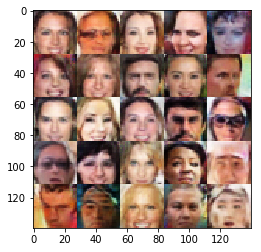

Epoch 5/25 Step 28500... Discriminator Loss: 2.4277... Generator Loss: 0.2008 ... Time spent=0.0920
Epoch 5/25 Step 28600... Discriminator Loss: 1.1864... Generator Loss: 0.7635 ... Time spent=0.0911


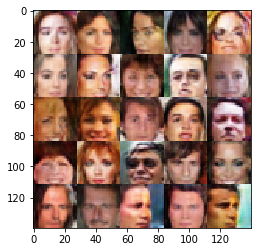

Epoch 5/25 Step 28700... Discriminator Loss: 1.6147... Generator Loss: 0.5685 ... Time spent=0.0919
Epoch 5/25 Step 28800... Discriminator Loss: 1.4778... Generator Loss: 0.5631 ... Time spent=0.0937


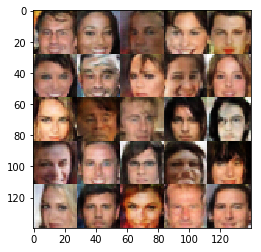

Epoch 5/25 Step 28900... Discriminator Loss: 0.7917... Generator Loss: 1.1918 ... Time spent=0.0921
Epoch 5/25 Step 29000... Discriminator Loss: 1.1273... Generator Loss: 1.0060 ... Time spent=0.0917


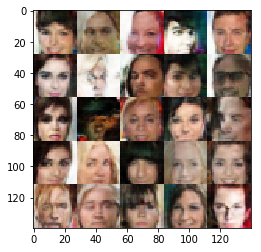

Epoch 5/25 Step 29100... Discriminator Loss: 0.8683... Generator Loss: 1.0318 ... Time spent=0.0909
Epoch 5/25 Step 29200... Discriminator Loss: 1.3473... Generator Loss: 0.6677 ... Time spent=0.0926


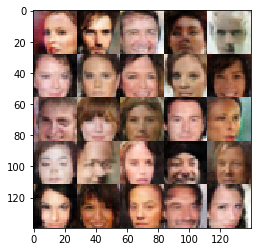

Epoch 5/25 Step 29300... Discriminator Loss: 1.7165... Generator Loss: 0.4589 ... Time spent=0.0934
Epoch 5/25 Step 29400... Discriminator Loss: 1.1557... Generator Loss: 0.7845 ... Time spent=0.0943


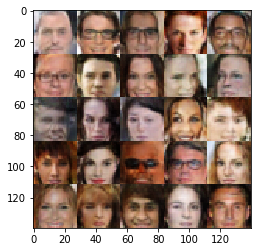

Epoch 5/25 Step 29500... Discriminator Loss: 2.8913... Generator Loss: 0.1507 ... Time spent=0.0914
Epoch 5/25 Step 29600... Discriminator Loss: 0.8304... Generator Loss: 1.1799 ... Time spent=0.0926


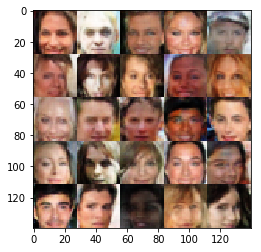

Epoch 5/25 Step 29700... Discriminator Loss: 0.8351... Generator Loss: 1.2166 ... Time spent=0.0915
Epoch 5/25 Step 29800... Discriminator Loss: 0.7006... Generator Loss: 1.4173 ... Time spent=0.0935


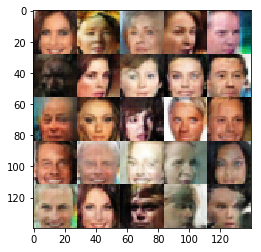

Epoch 5/25 Step 29900... Discriminator Loss: 1.7211... Generator Loss: 0.4656 ... Time spent=0.0906
Epoch 5/25 Step 30000... Discriminator Loss: 1.6437... Generator Loss: 0.5307 ... Time spent=0.0908


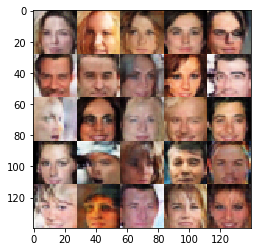

Epoch 5/25 Step 30100... Discriminator Loss: 1.0087... Generator Loss: 0.8716 ... Time spent=0.0915
Epoch 5/25 Step 30200... Discriminator Loss: 2.3056... Generator Loss: 0.3775 ... Time spent=0.0923


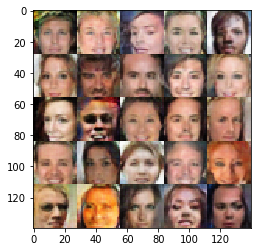

Epoch 5/25 Step 30300... Discriminator Loss: 0.9315... Generator Loss: 1.0170 ... Time spent=0.0924
Epoch 5/25 Step 30400... Discriminator Loss: 1.0272... Generator Loss: 1.0321 ... Time spent=0.0923


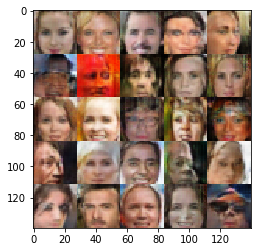

Epoch 5/25 Step 30500... Discriminator Loss: 1.0859... Generator Loss: 0.8837 ... Time spent=0.0923
Epoch 5/25 Step 30600... Discriminator Loss: 1.2205... Generator Loss: 0.8089 ... Time spent=0.0923


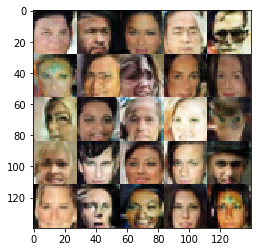

Epoch 5/25 Step 30700... Discriminator Loss: 0.5726... Generator Loss: 2.1557 ... Time spent=0.0920
Epoch 5/25 Step 30800... Discriminator Loss: 0.4038... Generator Loss: 3.2276 ... Time spent=0.0926


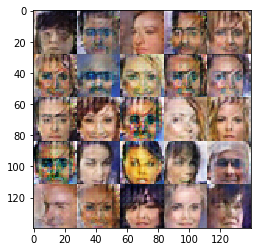

Epoch 5/25 Step 30900... Discriminator Loss: 0.5578... Generator Loss: 2.0580 ... Time spent=0.0933
Epoch 5/25 Step 31000... Discriminator Loss: 0.4635... Generator Loss: 2.5252 ... Time spent=0.0919


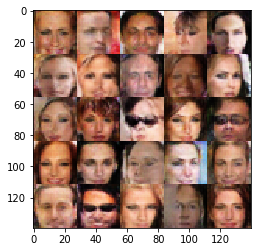

Epoch 5/25 Step 31100... Discriminator Loss: 0.6671... Generator Loss: 1.5652 ... Time spent=0.0920
Epoch 5/25 Step 31200... Discriminator Loss: 1.3171... Generator Loss: 0.6397 ... Time spent=0.0914


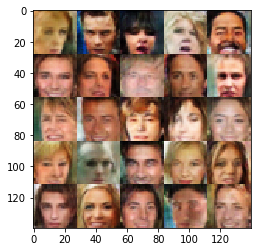

Epoch 5/25 Step 31300... Discriminator Loss: 0.7817... Generator Loss: 1.1513 ... Time spent=0.0917
Epoch 5/25 Step 31400... Discriminator Loss: 0.6231... Generator Loss: 1.8270 ... Time spent=0.0922


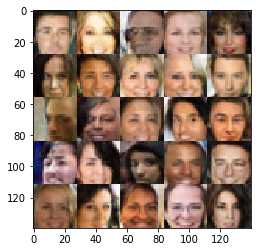

Epoch 5/25 Step 31500... Discriminator Loss: 0.5447... Generator Loss: 2.0333 ... Time spent=0.0926
Epoch 5/25 Step 31600... Discriminator Loss: 1.1345... Generator Loss: 0.7744 ... Time spent=0.0920


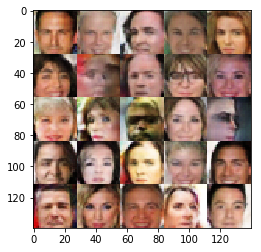

Epoch 6/25 Step 31700... Discriminator Loss: 0.9838... Generator Loss: 0.9227 ... Time spent=0.0918
Epoch 6/25 Step 31800... Discriminator Loss: 1.0523... Generator Loss: 1.0000 ... Time spent=0.0917


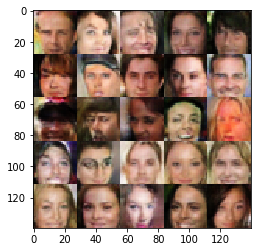

Epoch 6/25 Step 31900... Discriminator Loss: 1.4856... Generator Loss: 0.5140 ... Time spent=0.0928
Epoch 6/25 Step 32000... Discriminator Loss: 0.6269... Generator Loss: 1.7602 ... Time spent=0.0914


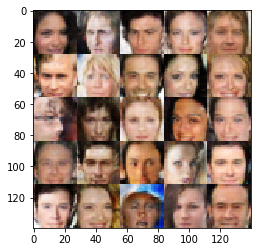

Epoch 6/25 Step 32100... Discriminator Loss: 0.7917... Generator Loss: 1.2833 ... Time spent=0.0932
Epoch 6/25 Step 32200... Discriminator Loss: 1.5482... Generator Loss: 0.6652 ... Time spent=0.0925


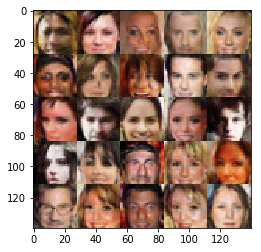

Epoch 6/25 Step 32300... Discriminator Loss: 0.7816... Generator Loss: 1.2191 ... Time spent=0.0934
Epoch 6/25 Step 32400... Discriminator Loss: 0.9059... Generator Loss: 0.9696 ... Time spent=0.0925


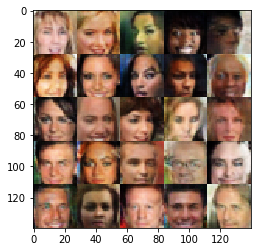

Epoch 6/25 Step 32500... Discriminator Loss: 1.5645... Generator Loss: 0.5257 ... Time spent=0.0937
Epoch 6/25 Step 32600... Discriminator Loss: 0.6661... Generator Loss: 1.5536 ... Time spent=0.0930


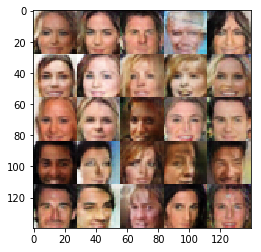

Epoch 6/25 Step 32700... Discriminator Loss: 0.7489... Generator Loss: 1.4873 ... Time spent=0.0937
Epoch 6/25 Step 32800... Discriminator Loss: 0.9150... Generator Loss: 1.5158 ... Time spent=0.0925


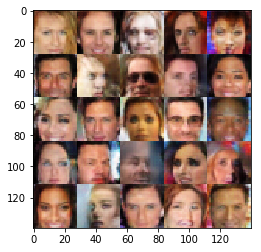

Epoch 6/25 Step 32900... Discriminator Loss: 0.8457... Generator Loss: 1.1180 ... Time spent=0.0944
Epoch 6/25 Step 33000... Discriminator Loss: 1.5965... Generator Loss: 0.5138 ... Time spent=0.0928


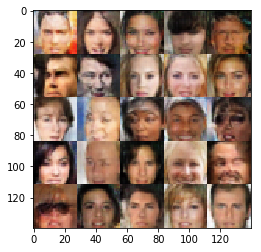

Epoch 6/25 Step 33100... Discriminator Loss: 0.7228... Generator Loss: 1.5407 ... Time spent=0.0948
Epoch 6/25 Step 33200... Discriminator Loss: 0.9961... Generator Loss: 1.0575 ... Time spent=0.0921


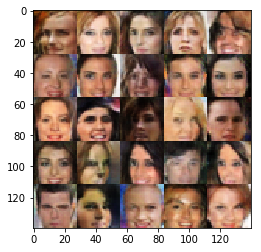

Epoch 6/25 Step 33300... Discriminator Loss: 0.6119... Generator Loss: 1.7147 ... Time spent=0.0926
Epoch 6/25 Step 33400... Discriminator Loss: 2.0396... Generator Loss: 0.3291 ... Time spent=0.0919


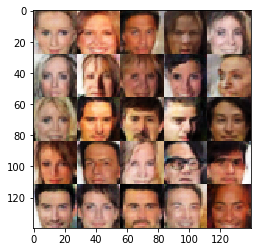

Epoch 6/25 Step 33500... Discriminator Loss: 2.3887... Generator Loss: 0.3297 ... Time spent=0.0939


In [ ]:
batch_size = 32
z_dim = 200
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 25

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.